# View images with Holoview

- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab/IN2P3/CNES, DESC-LSST fullmember, behalf AuxTel Teal VERA C. Rubin observatory
- creation date : November 26th 2021 
- version v0

CCIN2P3:

- works with kernels **anaconda3_auxtel** (with libradtran) and **anaconda3_auxtel_v2** (no libradtran)
- works with kernel **python 3** locally 

# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib import  transforms
import pandas as pd

import matplotlib.ticker                         # here's where the formatter is
import os
import re

plt.rcParams["figure.figsize"] = (12,12)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'

In [2]:
from iminuit import Minuit
import iminuit

In [3]:
iminuit.__version__

'2.7.0'

In [4]:
from astropy.io import fits
from spectractor import parameters
from spectractor.extractor.extractor import Spectractor
from spectractor.extractor.images import *
from scipy import ndimage, misc

In [5]:
from scipy.stats import kurtosis,skew
from scipy.stats import kurtosistest,skewtest,normaltest

In [6]:
from distutils.dir_util import copy_tree

https://docs.astropy.org/en/stable/visualization/index.html#functions

In [7]:
from astropy.visualization import (MinMaxInterval, SqrtStretch,ZScaleInterval,PercentileInterval,
                                   ImageNormalize,imshow_norm)
from astropy.visualization.stretch import SinhStretch, LinearStretch,AsinhStretch,LogStretch

In [8]:
from astropy.coordinates import SkyCoord, EarthLocation, AltAz

In [9]:
from astroquery.simbad import Simbad
#import astropy.coordinates as coord

import astropy.units as u

In [10]:
from astropy.wcs import WCS
from astropy.io import fits
from astropy.table import Table

In [11]:
import numpy as np
import pandas as pd


In [12]:
# Bokeh for interactive visualization
import bokeh
from bokeh.io import output_file, output_notebook, show
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource, CDSView, GroupFilter, HoverTool
from bokeh.plotting import figure
from bokeh.transform import factor_cmap

import holoviews as hv
from holoviews import streams, opts
from holoviews.operation.datashader import rasterize
from holoviews.operation.datashader import datashade, dynspread
from holoviews.plotting.util import process_cmap

import datashader as dsh
from holoviews.plotting.links import DataLink

In [13]:
from holoviews import opts, streams

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
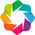

Loading BokehJS ...

In [14]:
# Set the holoviews plotting library to be bokeh
# You will see the holoviews + bokeh icons displayed when the library is loaded successfully
#hv.extension('bokeh')
hv.extension('bokeh', 'matplotlib')

# Display bokeh plots inline in the notebook
output_notebook()


In [15]:
# What versions of bokeh and holoviews nd datashader are we working with?
# This is important when referring to online documentation as
# APIs can change between versions.
print("Bokeh version: " + bokeh.__version__)
print("Holoviews version: " + hv.__version__)
print("Datashader version: " + dsh.__version__)

Bokeh version: 2.3.2
Holoviews version: 1.14.6
Datashader version: 0.13.0


# Configuration

In [16]:
version="v4.0"

In [17]:
# conversion in good inits
u_radtodeg=180.0/np.pi
u_degtorad=np.pi/180.
u_mtomm=1e3

## Path

In [18]:
# path index for each month
DATE="2021-07-07"
DATE2="2021_07_07"

In [19]:
# select if we run at CC or not (locally) 
HOSTCC=False

In [20]:
# Set path depending on which computer running (according HOSTCC)
if HOSTCC:
    path_auxtel="/sps/lsst/groups/auxtel"
    path_images=os.path.join(path_auxtel,"data/2021/holo/FlipCleans")
    
else:
    path_auxtel="/Users/dagoret/DATA/AuxTelData2021"
    path_images=os.path.join(path_auxtel,"holo/FlipCleans")

In [21]:
def file_target(filename):
    m=file_tag_forsorting(filename)
    if len(m)>0:
        return m
    elif re.search('NGC4755',filename):
        return ['NGC4755']
    else:
        return []
         

In [22]:
!ls /Users/dagoret/DATA/AuxTelData2021/holo/FlipCleans | grep NGC

Cor_holo4_003_NGC4755_2021-02-17_350.fits
Cor_holo4_003_NGC4755_2021-02-17_351.fits
Cor_holo4_003_NGC4755_2021-02-17_352.fits
Cor_holo4_003_NGC4755_2021-02-17_353.fits
Cor_holo4_003_NGC4755_2021-02-17_354.fits
Cor_holo4_003_NGC4755_2021-02-17_355.fits
Cor_holo4_003_NGC4755_2021-02-17_356.fits
Cor_holo4_003_NGC4755_2021-02-17_357.fits
Cor_holo4_003_NGC4755_2021-02-17_358.fits


In [23]:
filenames= ["Cor_holo4_003_NGC4755_2021-02-17_350.fits",
"Cor_holo4_003_NGC4755_2021-02-17_351.fits",
"Cor_holo4_003_NGC4755_2021-02-17_352.fits",
"Cor_holo4_003_NGC4755_2021-02-17_353.fits",
"Cor_holo4_003_NGC4755_2021-02-17_354.fits",
"Cor_holo4_003_NGC4755_2021-02-17_355.fits",
"Cor_holo4_003_NGC4755_2021-02-17_356.fits",
"Cor_holo4_003_NGC4755_2021-02-17_357.fits",
"Cor_holo4_003_NGC4755_2021-02-17_358.fits"]

In [24]:
# O : OK
# 1 : OK
# 2 : OK
# 3 : OK
filename_image=filenames[4]

In [25]:
fullfilename = os .path.join(path_images,filename_image)

In [26]:
from astropy.io import fits

In [27]:
hdu = fits.open(fullfilename)

In [28]:
hdu.info()

Filename: /Users/dagoret/DATA/AuxTelData2021/holo/FlipCleans/Cor_holo4_003_NGC4755_2021-02-17_354.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  Segment10     1 PrimaryHDU     121   ()      
  1                1 ImageHDU         7   (4072, 4000)   float64   


In [29]:
# extract header and the image
header=hdu[0].header
image=hdu[1].data

# Plot with matplotlib as it appears in DS9

In [30]:
#header

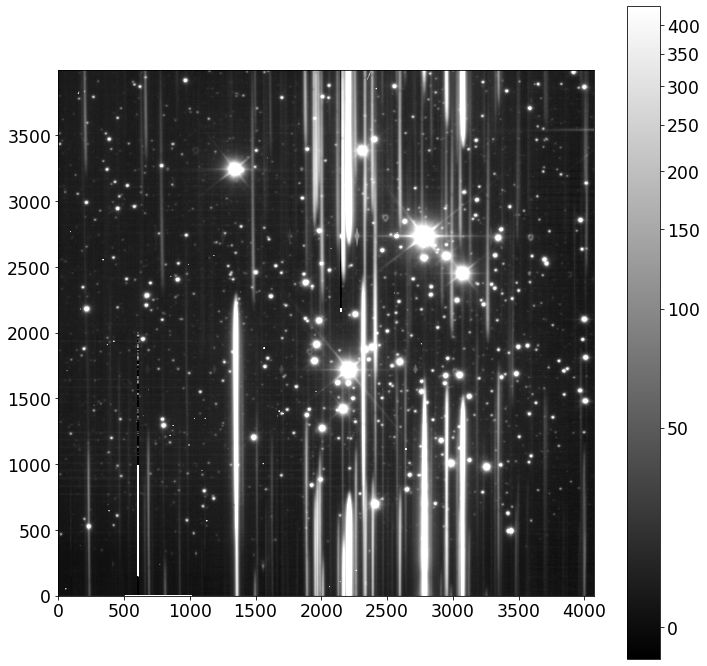

In [31]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
# ImageNormalize normalizes values to [0,1] before applying the stretch
# Create an ImageNormalize object
norm = ImageNormalize(image, interval=PercentileInterval(95.),stretch=AsinhStretch())
im = ax.imshow(image, origin='lower', norm=norm, cmap='gray')
fig.colorbar(im)

# Transform the image

In [32]:
transform = AsinhStretch() + PercentileInterval(95.)
#transform = AsinhStretch() + ZScaleInterval()

In [33]:
scaledImage=transform(image)

# Rotation

In [34]:
# 90° rotation clockwise
rotscaledImage=np.rot90(np.copy(scaledImage),k=1)

In [35]:
rotscaledImage.shape

(4072, 4000)

# Flip up down

In [36]:
flipudrotscaledImage=np.flipud(np.copy(rotscaledImage))

# Final image

In [37]:
finalImage=np.copy(rotscaledImage)
#flipudfinalImage=np.flipud(np.copy(finalImage))
flipudfinalImage=np.flipud(np.copy(finalImage))

# View in matplotlib

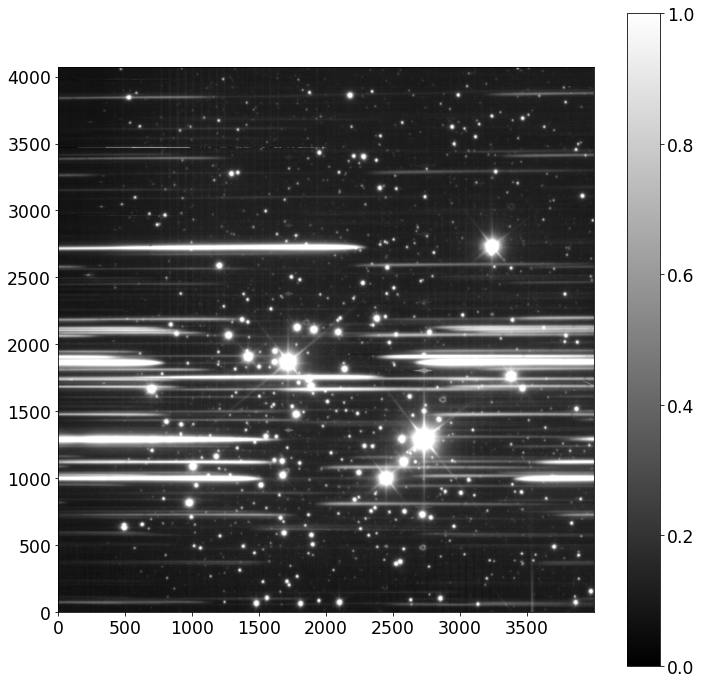

In [38]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
# ImageNormalize normalizes values to [0,1] before applying the stretch
im = ax.imshow(finalImage, origin='lower', cmap='gray')
fig.colorbar(im)

# View in Holoview

In [39]:
#from holoviews import streams
from holoviews.streams import Stream, param
listing = ', '.join(sorted([str(s.name) for s in param.descendents(streams.LinkedStream)]))
print('The linked stream classes supported by HoloViews are:\n\n{listing}'.format(listing=listing))

The linked stream classes supported by HoloViews are:

BoundsX, BoundsXY, BoundsY, BoxEdit, CDSStream, CurveEdit, DoubleTap, Draw, FreehandDraw, Lasso, LinkedStream, MouseEnter, MouseLeave, PanEnd, PlotReset, PlotSize, PointDraw, PointerX, PointerXY, PointerY, PolyDraw, PolyEdit, PressUp, RangeX, RangeXY, RangeY, SelectMode, Selection1D, SelectionXY, SingleTap, Tap


In [40]:
TOOLTIPS = [
    ('name', "$name"),
    ('index', "$index"),
    ('pattern', '@pattern'),
    ("x", "$x"),
    ("y", "$y"),
    ("value", "@image"),
    ('squared', '@squared')
]

TOOLTIPS = [
    ("(x,y)", "($x, $y)"),
]

hover = HoverTool(description='Custom Tooltip', tooltips=[('x', '@x'), ('y', '@y')])


# Custom hover tool for the source detections
myhover = HoverTool(
    tooltips=[
        ( 'x', '@x{0.2f}'),
        ( 'y', '@y{0.2f}'),
    ],
    formatters={
        'x' : 'printf',
        'y' : 'printf',
    },
    
)

In [41]:
# Define some default plot options for the Image
img_opts = dict(
                #height=600, width=700, 
                xaxis="bottom", 
                padding = 0.01, fontsize={'title': '8pt'},
                colorbar=True, toolbar='right', show_grid=True,
                aspect='equal',
                frame_width=600,
                tools=['hover','crosshair','undo','redo','zoom_in','zoom_out'],
                #tools=[myhover,'crosshair'],
               )     

In [42]:
PIXELTOMM=0.01
XMIN=-rotscaledImage.shape[1]/2*PIXELTOMM
XMAX=rotscaledImage.shape[1]/2*PIXELTOMM
YMIN=-rotscaledImage.shape[0]/2*PIXELTOMM
YMAX=rotscaledImage.shape[0]/2*PIXELTOMM

In [43]:
# Create the Image element.
bounds_img=(XMIN,YMIN,XMAX,YMAX)
img = hv.Image(np.flipud(np.fliplr(finalImage)), bounds=bounds_img,
#img = hv.Image(np.flipup(finalImage), bounds=bounds_img,
               kdims=['x', 'y']).opts(
    cmap = "Greys_r",  xlabel = 'x', ylabel ='y',
    title = filename_image,
    **img_opts)

In [44]:
rasterize(img)

:DynamicMap   []
   :Image   [x,y]   (z)

## Stream with a Box

In [45]:
boundsxy = (0, 0, 0, 0)
box = streams.BoundsXY(source=img, bounds=boundsxy)
dynamicMap = hv.DynamicMap(lambda bounds: hv.Bounds(bounds), streams=[box])

In [46]:
# Display the image and overlay the DynamicMap
layout = rasterize(img) * dynamicMap.opts(color='white')
#layout = img * dynamicMap.opts(color='white')
layout

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [x,y]   (z)
      .Bounds.I :Bounds   [x,y]

In [47]:
box

BoundsXY(bounds=(0, 0, 0, 0))

## stream with a TAP

In [48]:
posxy = hv.streams.Tap(source=img, x=0,y=0)
marker = hv.DynamicMap(lambda x, y: hv.Points([(x, y)]), streams=[posxy])
rasterize(img)* marker.opts(color='white', marker='x', size=20)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [x,y]   (z)
      .Points.I :Points   [x,y]

In [49]:
print('The scaled/raw value at position (%.3f, %.3f)' %
      (posxy.x, posxy.y))

The scaled/raw value at position (0.000, 0.000)


## PolyDraw streams

http://holoviews.org/reference/streams/bokeh/PolyDraw.html

In [50]:
# Define some default plot options for the Image
img_opts = dict(
                #height=600, width=700, 
                xaxis="bottom", 
                padding = 0.01, fontsize={'title': '8pt'},
                colorbar=True, toolbar='right', show_grid=True,
                aspect='equal',
                frame_width=600,
                tools=['hover','crosshair','undo','redo','zoom_in','zoom_out'],
                #tools=[myhover,'crosshair'],
               )     

In [51]:
#pointer = streams.PointerXY(x=0, y=0, source=img)

In [52]:
img.opts(
    cmap = "Greys_r",  xlabel = 'x', ylabel ='y',
    title = filename_image,
    **img_opts)

rasterize(img)

:DynamicMap   []
   :Image   [x,y]   (z)

In [53]:
path = hv.Path([[(-10, 0), (10, 0)],[(-5,2),(5,2)]])

poly = hv.Polygons([[(2, 2), (5, 8), (8, 2)]])
path_stream = streams.PolyDraw(source=path, drag=True,show_vertices=True,num_objects=1)
poly_stream = streams.PolyDraw(source=poly, drag=True, num_objects=4,
                               show_vertices=True, styles={
                                   'fill_color': ['red', 'green', 'blue']
                               })

print(path_stream.data)

None


In [54]:
#path.opts(opts.Path(color='red', height=800, line_width=3, width=100, active_tools=['poly_draw']))
path.opts(opts.Path(color='red', line_width=3, active_tools=['poly_draw']))
rasterize(img) * path 

:DynamicMap   []
   :Overlay
      .Image.I :Image   [x,y]   (z)
      .Path.I  :Path   [x,y]

In [55]:
path_stream.data

{'xs': [array([-10,  10]), array([-5,  5])],
 'ys': [array([0, 0]), array([2, 2])]}

In [56]:
table = hv.Table((path_stream.data['xs'], path_stream.data['ys']), 'x', 'y')
table

:Table   [x]   (y)

# Superimpose data

In [57]:
filedata1="../data/orientations/orientations-holo_auxtel_v9.xlsx"
df1=pd.read_excel(filedata1,index_col=None,header=42)

In [58]:
filedata2="../data/orientations/orientations-holo-26nov2021.xlsx"
df2=pd.read_excel(filedata2,index_col=None,header=80)

In [59]:
df1=df1[['X(mm)', 'Y(mm)','degré','dalpha']]
df2=df2[['X(mm)', 'Y(mm)','degré','dalpha']]

In [60]:
df2["X(mm)"] = - df2["X(mm)"].values 
df2["degré"] = - df2["degré"].values

In [61]:
df1.head()

,X(mm),Y(mm),degré,dalpha
0,-1.76,17.84,-0.562141,0.059175
1,-12.40,6.52,-0.305240,0.071822
2,2.82,-2.17,-0.115807,0.057904
3,-7.31,-7.95,-0.147236,0.084135
4,-4.49,-10.92,0.000000,0.058855


In [62]:
df2.head()

,X(mm),Y(mm),degré,dalpha
0,13.07,-15.64,0.407914,0.067987
1,12.93,-9.86,0.339298,0.061691
2,13.10,-3.77,-0.000000,0.062516
3,13.26,2.30,-0.148473,0.059389
4,13.38,8.31,-0.464629,0.058080


In [63]:
def getx1y1x2y2(df):
    """
    """
    NumberofPointsData=len(df)
    
   
    u_radtodeg=180.0/np.pi

    Xdata=df["X(mm)"].values
    Ydata=df["Y(mm)"].values
    alphadata=df["degré"].values
    
    
    
    # output
    X1data=np.zeros(NumberofPointsData)
    Y1data=np.zeros(NumberofPointsData)
    X2data=np.zeros(NumberofPointsData)
    Y2data=np.zeros(NumberofPointsData)
    
    
    slope_mag=10 # slope magnification
    
    for idx in np.arange(NumberofPointsData):
        
        
        x_i=Xdata[idx]
        y_i=Ydata[idx]
        slope=np.tan(alphadata[idx]*u_degtorad)
        slope*=slope_mag
   
        x_1=x_i-5
        x_2=x_i+5
    
    
        y_1=(x_1-x_i)*slope+y_i
        y_2=(x_2-x_i)*slope+y_i
    
        X1data[idx]=x_1
        Y1data[idx]=y_1
    
        X2data[idx]=x_2
        Y2data[idx]=y_2
        
    return X1data,Y1data,X2data,Y2data

In [64]:
X1data_1,Y1data_1,X2data_1,Y2data_1 = getx1y1x2y2(df1)
X1data_2,Y1data_2,X2data_2,Y2data_2 = getx1y1x2y2(df2)

In [65]:
len(df1)

18

In [66]:
X1data_1

array([ -6.76, -17.4 ,  -2.18, -12.31,  -9.49,  -2.29, -20.15,  -1.91,
         8.29,   2.21,   1.29,  -3.06, -12.46,   7.89, -18.58, -18.95,
        -9.24,   8.03])

In [67]:
hvscatter1 = hv.Scatter(df1, 'X(mm)', 'Y(mm)')
hvscatter1.opts(color='blue', marker='o', size=8)

:Scatter   [X(mm)]   (Y(mm))

In [68]:
hvscatter2 = hv.Scatter(df2, 'X(mm)', 'Y(mm)')
hvscatter2.opts(color='red', marker='o', size=8)

:Scatter   [X(mm)]   (Y(mm))

In [69]:
rasterize(img) * hvscatter1 * hvscatter2

:DynamicMap   []
   :Overlay
      .Image.I    :Image   [x,y]   (z)
      .Scatter.I  :Scatter   [X(mm)]   (Y(mm))
      .Scatter.II :Scatter   [X(mm)]   (Y(mm))

In [70]:
all_segments1=list(zip(X1data_1,Y1data_1,X2data_1,Y2data_1))
all_segments2=list(zip(X1data_2,Y1data_2,X2data_2,Y2data_2))

In [71]:
all_hvsegments1=hv.Segments(all_segments1)
hvscatter1 * all_hvsegments1.opts(line_width=1, color='green')

:Overlay
   .Scatter.I  :Scatter   [X(mm)]   (Y(mm))
   .Segments.I :Segments   [x0,y0,x1,y1]

In [72]:
layout1 = rasterize(img) * hvscatter1   * all_hvsegments1 
layout1

:DynamicMap   []
   :Overlay
      .Image.I    :Image   [x,y]   (z)
      .Scatter.I  :Scatter   [X(mm)]   (Y(mm))
      .Segments.I :Segments   [x0,y0,x1,y1]

In [73]:
all_hvsegments2=hv.Segments(all_segments2)
hvscatter2 * all_hvsegments2.opts(line_width=1, color='orange')

:Overlay
   .Scatter.I  :Scatter   [X(mm)]   (Y(mm))
   .Segments.I :Segments   [x0,y0,x1,y1]

In [74]:
layout2 = rasterize(img) * hvscatter2   * all_hvsegments2 
layout2

:DynamicMap   []
   :Overlay
      .Image.I    :Image   [x,y]   (z)
      .Scatter.I  :Scatter   [X(mm)]   (Y(mm))
      .Segments.I :Segments   [x0,y0,x1,y1]

In [75]:
hvscatter1 * all_hvsegments1 * hvscatter2 * all_hvsegments2

:Overlay
   .Scatter.I   :Scatter   [X(mm)]   (Y(mm))
   .Segments.I  :Segments   [x0,y0,x1,y1]
   .Scatter.II  :Scatter   [X(mm)]   (Y(mm))
   .Segments.II :Segments   [x0,y0,x1,y1]

In [76]:
layout = rasterize(img) * hvscatter1 * hvscatter2  * all_hvsegments1 *all_hvsegments2

In [77]:
layout

:DynamicMap   []
   :Overlay
      .Image.I     :Image   [x,y]   (z)
      .Scatter.I   :Scatter   [X(mm)]   (Y(mm))
      .Scatter.II  :Scatter   [X(mm)]   (Y(mm))
      .Segments.I  :Segments   [x0,y0,x1,y1]
      .Segments.II :Segments   [x0,y0,x1,y1]